In [1]:
import class_backtester
import utils

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
plt.style.use('ggplot')

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MaxAbsScaler, PowerTransformer
from sklearn.base import clone


import plotly.graph_objs as go
import plotly.offline as pyo
from plotly.subplots import make_subplots
import plotly.io as pio

import random
import re

import quantstats as qs
# pd.set_option('display.max_rows', None)

# 0. Summary

In this notebook, we select the best model chosen from notebook 04_insample_modeling_and_analysis to run on the out of sample data (2016-01 to 2021-12). 
* According to our performance analysis on the insample data, the model and trading strategy we will select is:
    * *Model*: Lasso Regression that has been Optuna optimized
    * *Trading Strategy*: MSR (Maximum Sharpe Ratio)

We will refer to this combination as msr_lasso_opt from here onwards within this notebook.

----
# 1. Preprocess the outsample data

### Add necessary columns & perform data cleaning

In [2]:
test_df = pd.read_csv('test_df_extra_features.csv')
# Add duplicate beta factor columns for constraint purposes
test_df['cons_beta_mktrf'] = test_df['beta_mktrf']
test_df['cons_beta_smb'] = test_df['beta_smb']
test_df['cons_beta_hml'] = test_df['beta_hml']
test_df['cons_beta_mom'] = test_df['beta_mom']

# Adding portfolio betas for benchmark
test_df['vw'] = test_df['mktcap']/test_df.groupby(['date'])['mktcap'].transform('sum')
beta_list = ['beta_mktrf', 'beta_smb', 'beta_hml', 'beta_mom']
for beta in beta_list:
    test_df[f'{beta}_bench'] = test_df.groupby('date').apply(lambda df: df[beta] * df['vw']).reset_index().iloc[:, -1]
    test_df[f'{beta}_bench'] = test_df.groupby('date')[f'{beta}_bench'].transform(sum)
    
test_df['date'] = pd.to_datetime(test_df['date'])
test_df = test_df.dropna()
test_df = test_df.rename(columns = {'av_atmcall': 'iv_atmcall',
                                                                        'av_otmput': 'iv_otmput', 
                                                                        'av_otmcall': 'iv_otmcall'}
)

### Add winsorization pipeline

In [3]:
pipept = Pipeline([
    ('ws', class_backtester.Winsorize(level_winsorize = 0.025)),
    ('qt', PowerTransformer()),
    ('maxabs', MaxAbsScaler())
])

### Define features used for our model (msr_lasso_opt)

In [4]:
feature_names = list(test_df.columns)
list_to_remove = ['permno', 'date', 'secid']
feature_names_final  = list(set(feature_names) - set(list_to_remove))

lag_features = [x for x in test_df.columns if 'lag' in x]
glb_features = [x for x in test_df.columns if 'glb' in x]
mfis_features = [x for x in test_df.columns if 'mfis' in x]
beta_original_features = [x for x in test_df.columns if '_original' in x]

# these columns are not predictors 
not_modeling_features = ['permno', 'date', 'secid', 'fret1d'] + beta_original_features

# these columns should not be winsorized
# glb and mfis features are already winsorized (0.025 level for each maturity on the monthly basis)
columns_to_not_preprocess = not_modeling_features + glb_features + mfis_features + lag_features

preprocess_features = list(set(test_df.columns) - set(columns_to_not_preprocess))
modeling_features = list(set(test_df.columns) - set(not_modeling_features))

----
# 2. Run Backtesting on Outsample Data

### Backtesting Configuration

In [ ]:
# Backtesting Configuration
msr_lasso_opt = {'msr_lasso': {'opt_function': class_backtester.MSR, 'alpha_estimation_method': 'Lasso', 'alpha': 0.010906, 'parsing': clone(pipept)}}

# Run Backtester
backtester = class_backtester.Backtester(
    df = test_df,
    params = None,
    optimise = True,
    preprocess_features = preprocess_features,
    modeling_features = modeling_features,
    rolling_frw = '1D',
    look_back_prm = 252,
    configurations = msr_lasso_opt,
    col_to_pred = 'fret1d',
    days_avoid_bias = 1
)
backtester.run_backtest()

In [ ]:
# After backtesting, save your results
utils.save_results(backtester, 'msr_lasso_opt')

----
# 3. msr_lasso_opt Strategy Performance Analysis

### Create benchmark dataframe

In [5]:
benchmark = test_df.copy()
benchmark['ret_vw'] = benchmark['ret'] * benchmark['vw']
benchmark['return'] = benchmark.groupby(by = ['date'])['ret_vw'].transform(sum)
benchmark = benchmark.groupby(by = ['date']).first().reset_index()

### Returns

In [6]:
# Add benchmark returns
benchmark_returns = benchmark[['date', 'return']]
benchmark_returns['date'] = benchmark_returns['date'].dt.strftime('%Y-%m-%d')
benchmark_returns = benchmark_returns.rename(columns = {'return': 'benchmark'})

test_returns_msr_lasso_opt = pd.read_csv('/Users/vinh/FS/quant_trading/group_project/test/returns/msr_lasso_test_opt_returns_df.csv')

# Concatenate returns
test_returns = pd.concat([benchmark_returns,
                          test_returns_msr_lasso_opt],
                         axis = 1)
test_returns = test_returns.loc[:, ~test_returns.columns.duplicated()]    
test_returns = test_returns.fillna(0.0)
test_returns = test_returns[test_returns['date'] >= '2016-01-04'] # 2016-01-04 is when predictions start for the out of sample test data
test_returns = test_returns.drop(columns = 'Unnamed: 0')

test_returns = test_returns.set_index('date')

In [7]:
test_results = pd.DataFrame()
for config in list(test_returns.columns):
    results = utils.calculate_performance_metrics(test_returns, config, risk_free_rate = 0.0)
    test_results = pd.concat([test_results, results])

test_results = test_results.sort_values(by = ['max_drawdown', 'smart_sortino_ratio'], ascending = [False, True])
test_results = test_results.round(3)
test_results = test_results.reset_index(drop = True)
test_results

,model_&_strategy,max_drawdown,smart_sortino_ratio,cum_returns,sharpe_ratio,calmar,avg_loss,vol_annualized,win_loss_ratio
0,msr_lasso_opt,-27.621,1.201,135.43,1.031,0.556,-0.006,0.149,0.938
1,benchmark,-29.385,1.173,140.26,1.011,0.536,-0.006,0.157,0.928


----
# 4. Plotting

### Realized betas of msr_lasso_opt portfolio vs. benchmark

#### Compiled optimal weights

In [82]:
test_weights_msr_lasso_opt = pd.read_csv('/Users/vinh/FS/quant_trading/group_project/test/weights/msr_lasso_test_opt_optimal_weights_df.csv')
test_weights_msr_lasso_opt = test_weights_msr_lasso_opt.fillna(0.0)
test_weights_msr_lasso_opt = test_weights_msr_lasso_opt[test_weights_msr_lasso_opt['date'] >= '2016-01-04'] # 2016-01-04 is when predictions start for the out of sample test data
test_weights_msr_lasso_opt = test_weights_msr_lasso_opt.drop(columns = 'Unnamed: 0')
test_weights_msr_lasso_opt['date'] = pd.to_datetime(test_weights_msr_lasso_opt['date'])

### Merge optimal weights dataframe with benchmark

In [83]:
temp = test_df.copy()
temp = temp[['permno', 'date', 'beta_mktrf', 'beta_smb', 'beta_hml', 'beta_mom', 'beta_mktrf_bench', 'beta_smb_bench', 'beta_hml_bench', 'beta_mom_bench']]

test_weights_msr_lasso_opt = pd.merge(test_weights_msr_lasso_opt, temp, on = ['permno', 'date'], how = 'inner')

In [84]:
msr_lasso_opt_portfolio_betas = pd.DataFrame({
    'permno': test_weights_msr_lasso_opt['permno'],
    'date': test_weights_msr_lasso_opt['date'],
    'beta_mktrf_bench': test_weights_msr_lasso_opt['beta_mktrf_bench'],
    'beta_smb_bench': test_weights_msr_lasso_opt['beta_smb_bench'],
    'beta_hml_bench': test_weights_msr_lasso_opt['beta_hml_bench'],
    'beta_mom_bench': test_weights_msr_lasso_opt['beta_mom_bench'],
    'msr_lasso_opt_beta_mktrf': test_weights_msr_lasso_opt['msr_lasso_opt'] * test_weights_msr_lasso_opt['beta_mktrf'],
    'msr_lasso_opt_beta_smb': test_weights_msr_lasso_opt['msr_lasso_opt'] * test_weights_msr_lasso_opt['beta_smb'],
    'msr_lasso_opt_beta_hml': test_weights_msr_lasso_opt['msr_lasso_opt'] * test_weights_msr_lasso_opt['beta_hml'],
    'msr_lasso_opt_beta_mom': test_weights_msr_lasso_opt['msr_lasso_opt'] * test_weights_msr_lasso_opt['beta_mom']
})

msr_lasso_opt_portfolio_betas['msr_lasso_opt_beta_mktrf'] = msr_lasso_opt_portfolio_betas.groupby('date')['msr_lasso_opt_beta_mktrf'].transform(sum)
msr_lasso_opt_portfolio_betas['msr_lasso_opt_beta_smb'] = msr_lasso_opt_portfolio_betas.groupby('date')['msr_lasso_opt_beta_smb'].transform(sum)
msr_lasso_opt_portfolio_betas['msr_lasso_opt_beta_hml'] = msr_lasso_opt_portfolio_betas.groupby('date')['msr_lasso_opt_beta_hml'].transform(sum)
msr_lasso_opt_portfolio_betas['msr_lasso_opt_beta_mom'] = msr_lasso_opt_portfolio_betas.groupby('date')['msr_lasso_opt_beta_mom'].transform(sum)

msr_lasso_opt_portfolio_betas = msr_lasso_opt_portfolio_betas.groupby(by = ['date']).first().reset_index()

### Compute delta of the betas vs. benchmark

In [86]:
# Create lists of beta columns for each model/strategy
bench_betas = [col for col in msr_lasso_opt_portfolio_betas if 'bench' in col]
msr_lasso_opt_betas = [col for col in msr_lasso_opt_portfolio_betas if 'msr_lasso_opt' in col]

# Compile information into dictionary
portfolio_beta_dict = {'msr_lasso_opt_betas': msr_lasso_opt_betas}

# Calculate percent change of each beta column with respect to the benchmark for each model/strategy
model_beta_pct_change = pd.DataFrame()
for key, value in portfolio_beta_dict.items():
    temp = pd.DataFrame()
    for i in range(len(bench_betas)):
        temp['date'] = msr_lasso_opt_portfolio_betas['date']
        temp[f'{value[i]}_delta'] = np.abs(msr_lasso_opt_portfolio_betas[bench_betas[i]] - msr_lasso_opt_portfolio_betas[value[i]])
        # msr_lasso_opt_portfolio_betas[[bench_betas[i], value[i]]].pct_change(axis = 1)[value[i]]
        # temp[f'{value[i]}_delta_roll10'] = temp[f'{value[i]}_delta'].rolling(10).mean()
        # temp = temp.drop(columns = [f'{value[i]}_delta'])
    
    model_beta_pct_change = pd.concat([model_beta_pct_change, temp], axis = 1)
model_beta_pct_change = model_beta_pct_change.dropna(axis = 0)

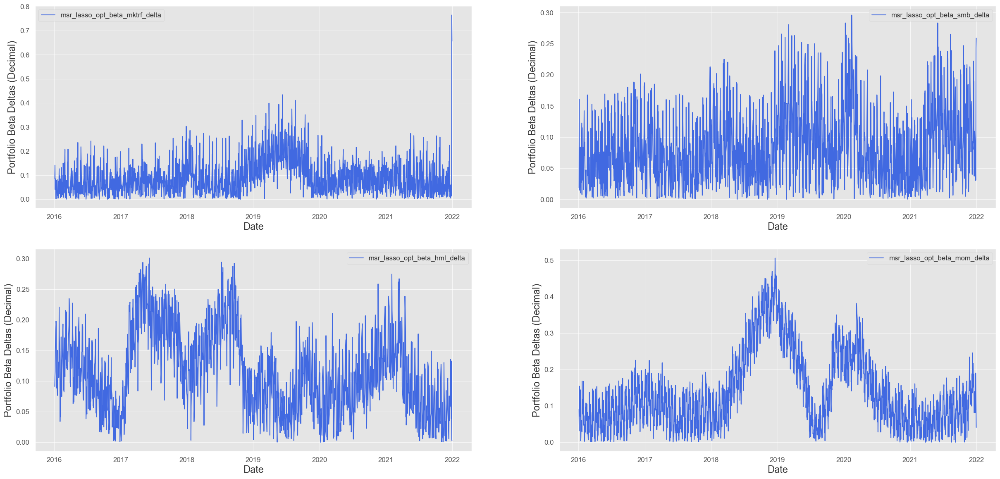

In [91]:
beta_names = ['beta_mktrf', 'beta_smb', 'beta_hml', 'beta_mom']
colors = ['royalblue']
idx = 0
fig, ax = plt.subplots(nrows = 2, ncols = 2, figsize = (30, 14))
for row in ax:
    for col in row:
        betas_to_plot = [col for col in model_beta_pct_change if beta_names[idx] in col]
        temp = model_beta_pct_change[['date'] + betas_to_plot].set_index('date')
        
        lines = col.plot(model_beta_pct_change[['date'] + betas_to_plot].set_index('date'))
        for i in range(len(lines)):
            lines[i].set_color(colors[i])
            
        col.legend(betas_to_plot)
        col.set_xlabel('Date', fontsize = 17)
        col.set_ylabel('Portfolio Beta Deltas (Decimal)', fontsize = 17)
        
        # yticks = np.linspace(col.get_ylim()[0], col.get_ylim()[1], num = 5)
        # yticklabels = ['-0.05', '-0.025', '0', '0.025', '0.05']
        # col.set_yticks(yticks)
        # col.set_yticklabels(yticklabels)
        
        idx += 1

### Plot cumulative returns vs. benchmark

In [14]:
benchmark_metrics = benchmark.loc[benchmark['date'] >= '2016-01-04'][['date', 'return']].set_index('date')

In [15]:
msr_lasso_opt_metrics = test_returns_msr_lasso_opt.loc[test_returns_msr_lasso_opt['date'] >= '2016-01-04'][['date', 'msr_lasso_opt']].set_index('date')
msr_lasso_opt_metrics = msr_lasso_opt_metrics.rename(columns = {'msr_lasso_opt': 'return'})

best_metrics = {'benchmark': benchmark_metrics,
                'msr_lasso_opt': msr_lasso_opt_metrics}

benchmark        1.010635
msr_lasso_opt    1.031480
dtype: float64


,benchmark,msr_lasso_opt
date,,
2016-01-04,-0.011993,0.004651
2016-01-05,0.005062,-0.006883
2016-01-06,-0.007222,-0.015158
2016-01-07,-0.015599,-0.007825
2016-01-08,-0.008468,0.001437
...,...,...
2021-12-27,0.012504,0.001521
2021-12-28,0.001601,0.002739
2021-12-29,0.003077,-0.002126


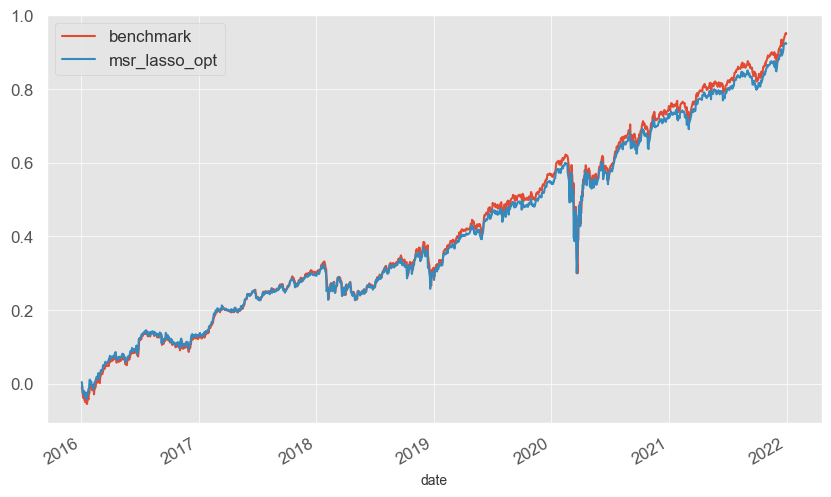

In [17]:
utils.get_metrics(best_metrics)

### Plot QuantStats Report

Sharpe ratio = 1.0314804781800233
Average daily return (bps)= 6.110067871481986
-------------


                           Strategy    Benchmark
-------------------------  ----------  -----------
Start Period               2016-01-04  2016-01-04
End Period                 2021-12-31  2021-12-31
Risk-Free Rate             0.0%        0.0%
Time in Market             100.0%      100.0%

Cumulative Return          135.43%     140.26%
CAGR﹪                     15.35%      15.75%

Sharpe                     1.03        1.01
Prob. Sharpe Ratio         99.39%      99.29%
Smart Sharpe               0.83        0.82
Sortino                    1.49        1.45
Smart Sortino              1.2         1.17
Sortino/√2                 1.05        1.03
Smart Sortino/√2           0.85        0.83
Omega                      1.25        1.25

Max Drawdown               -27.62%     -29.39%
Longest DD Days            229         227
Volatility (ann.)          14.93%      15.69%
R^2                        0.04        0.04
Information Ratio          -0.0        -0.0
Calmar                     0.56      

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2020-02-14,2020-03-20,2020-07-28,165,-27.620588,-21.573434
2,2018-11-30,2018-12-21,2019-02-21,83,-10.810490,-8.708988
3,2018-01-26,2018-05-01,2018-09-12,229,-9.529901,-9.341599
4,2020-09-02,2020-09-22,2020-10-09,37,-5.860614,-5.325114
5,2020-10-12,2020-10-29,2020-11-09,28,-5.433495,-5.270261


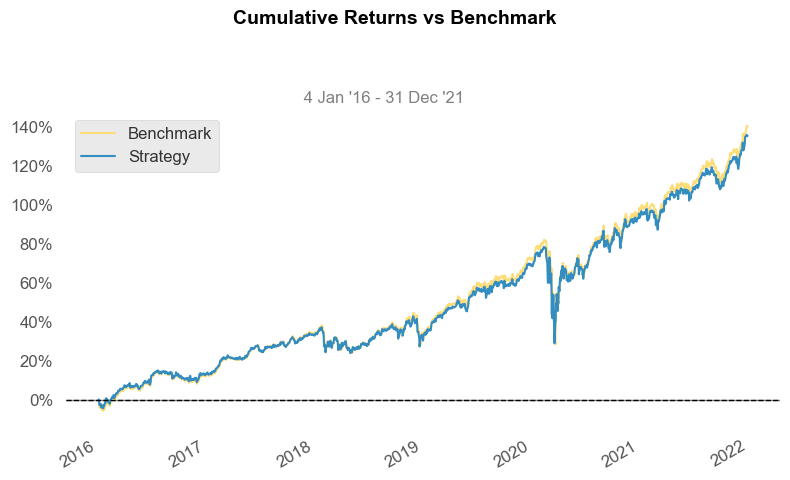

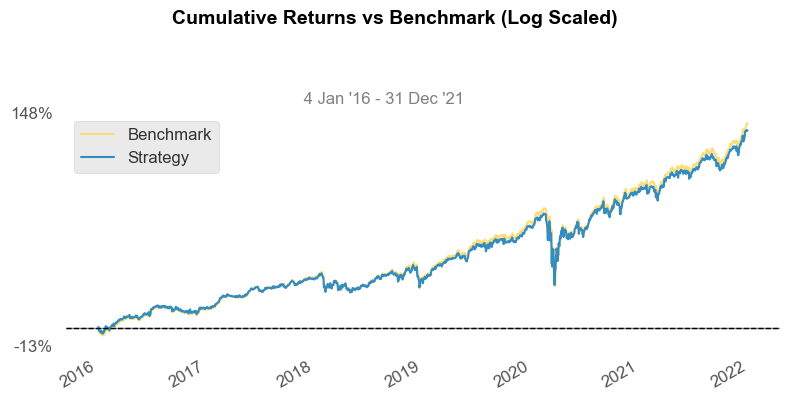

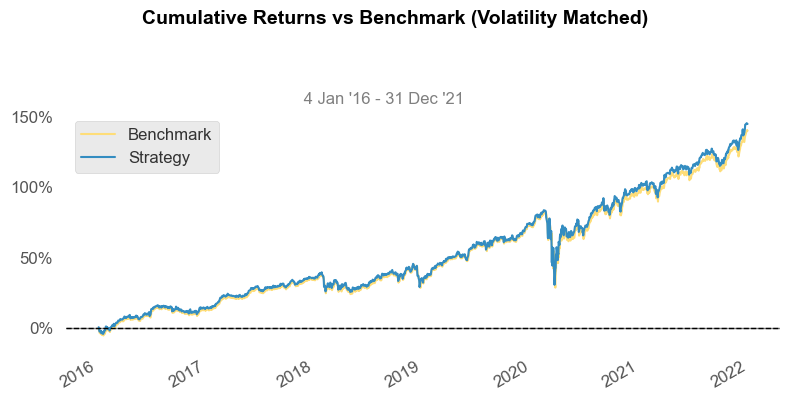

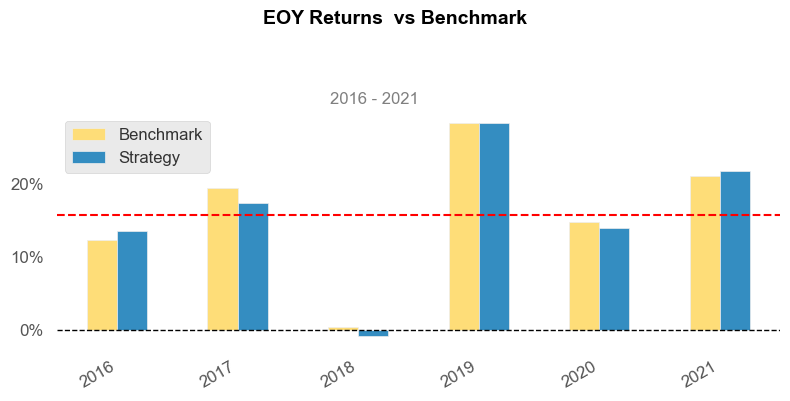

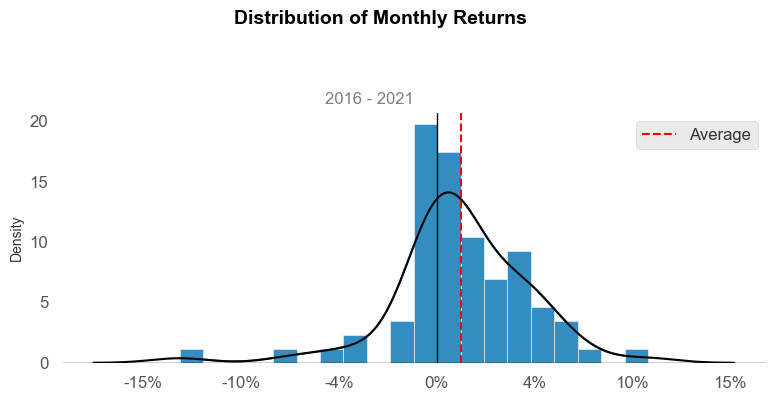

...

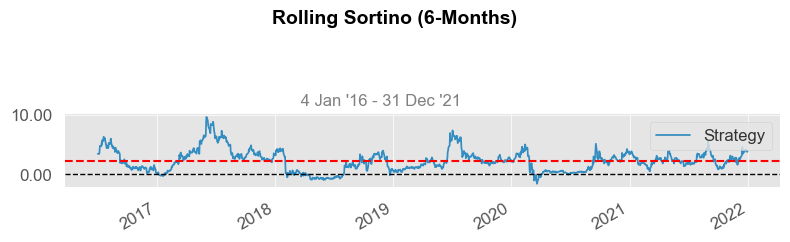

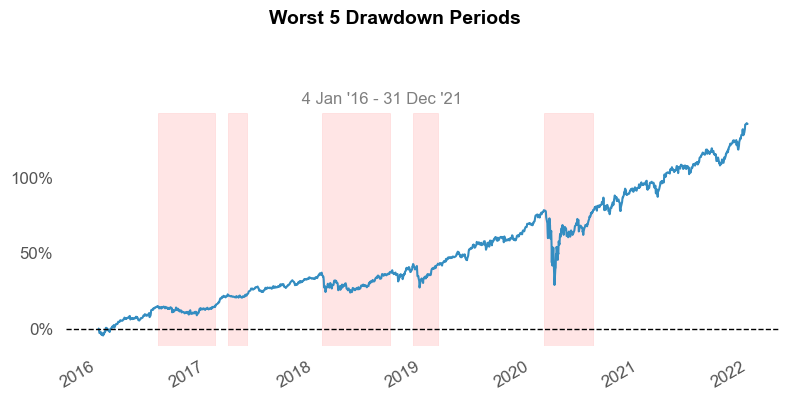

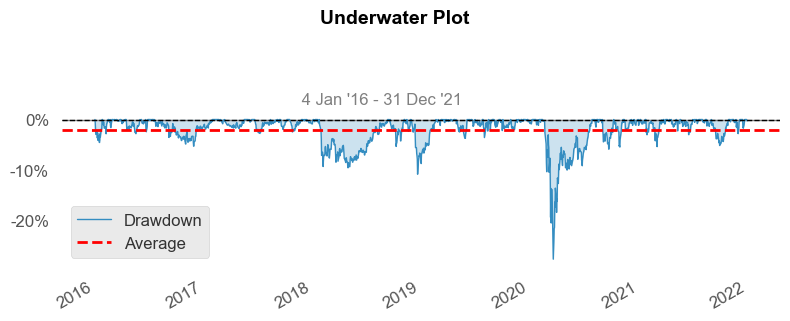

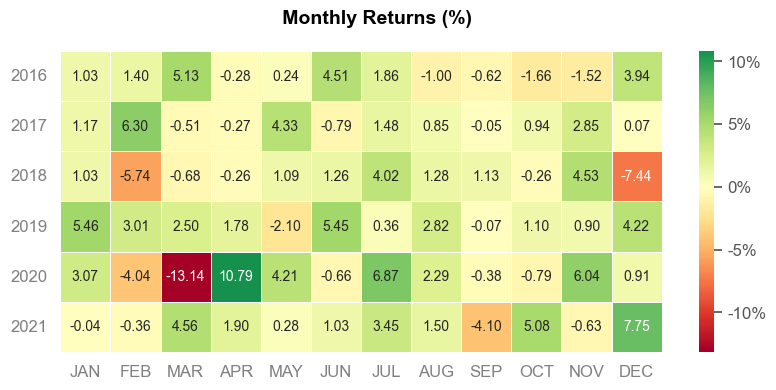

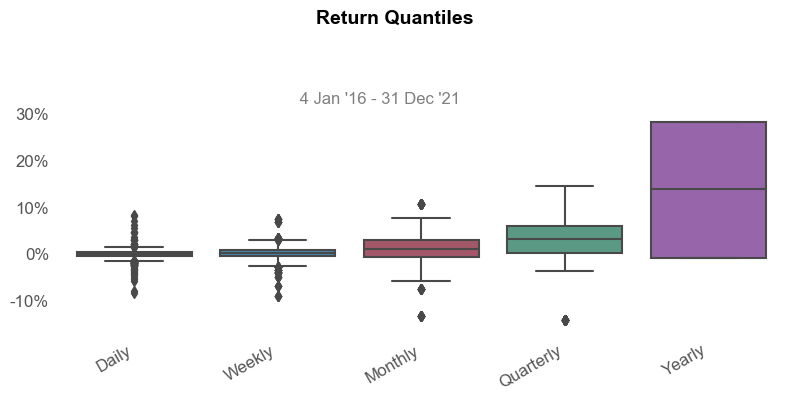

In [ ]:
utils.perform_trading_analysis(test_returns, 'msr_lasso_opt', benchmark_metrics)

---
### Plot Weights and Benchmark Weights

In [ ]:
df = pd.read_csv('msr_lasso_test_opt_optimal_weights_df.csv', index_col=[0])
df.head()

,permno,date,msr_lasso_opt
0,10874.0,2015-01-02,0.0
1,10874.0,2015-01-05,0.0
2,10874.0,2015-01-06,0.0
3,10874.0,2015-01-07,0.0
4,10874.0,2015-01-08,0.0


In [ ]:
df = df.loc[(df['date'] >= '2015-12-31') & (df['date'] <= '2021-12-29')]

In [ ]:
# Create a list of traces for each permno
traces = []
for permno in df['permno'].unique():
    df_sub = df.loc[df['permno'] == permno]
    trace = go.Scatter(x=df_sub['date'], y=df_sub['msr_lasso_opt'], name=str(permno))
    traces.append(trace)

# Set up the layout and figure
layout = go.Layout(title='Weight by Permno', xaxis_title='Time', yaxis_title='Weight')
fig = go.Figure(data=traces, layout=layout)

# Display the plot
pyo.iplot(fig)

---
#### Adding benchmark portfolio

In [ ]:
benchmark = pd.read_csv('benchmark_df.csv', index_col=[0])

In [ ]:
benchmark = benchmark.loc[(benchmark['date'] >= '2015-09-11') & (benchmark['date'] <= '2021-12-29')]

In [ ]:
# Create a list of traces for each permno
traces = []
for permno in benchmark['permno'].unique():
    df_sub = benchmark.loc[benchmark['permno'] == permno]
    trace = go.Scatter(x=df_sub['date'], y=df_sub['vw'], name=str(permno))
    traces.append(trace)

# Set up the layout and figure
layout = go.Layout(title='Benchmark Weight by Permno', xaxis_title='Time', yaxis_title='Weight')
fig = go.Figure(data=traces, layout=layout)

# Display the plot
pyo.iplot(fig)

&nbsp;

In [ ]:
print(df.shape, benchmark.shape)
df_merge = df.merge(benchmark, on=['permno', 'date'])
df_merge.shape

(75498, 3) (75448, 3)


(75448, 4)

In [ ]:
df_merge.head()

,permno,date,msr_lasso_opt,vw
0,10874.0,2016-01-04,0.002194,0.002438
1,10874.0,2016-01-05,0.002195,0.002438
2,10874.0,2016-01-06,0.002157,0.002397
3,10874.0,2016-01-07,0.002121,0.002356
4,10874.0,2016-01-08,0.002081,0.002312


In [ ]:
df_merge['deviation'] = df_merge['msr_lasso_opt'] - df_merge['vw']

In [ ]:
# Create a list of traces for each permno
traces = []
for permno in df['permno'].unique():
    df_sub = df_merge.loc[df_merge['permno'] == permno]
    trace = go.Scatter(x=df_sub['date'], y=df_sub['msr_lasso_opt'], name=str(int(permno)))
    traces.append(trace)

    trace = go.Scatter(x=df_sub['date'], y=df_sub['deviation'], name=' deviation for '+ str(int(permno)))
    traces.append(trace)
    break



# Set up the layout and figure
layout = go.Layout(title='', xaxis_title='Time', yaxis_title='Weight')
fig = go.Figure(data=traces, layout=layout)

# Display the plot
pyo.iplot(fig)

In [ ]:
# Create a list of traces for each permno
traces = []

l = [22111, 18163, 11308, 22752]
for i, permno in enumerate(l):
    df_sub = df_merge.loc[df_merge['permno'] == permno]
    trace1 = go.Scatter(x=df_sub['date'], y=df_sub['msr_lasso_opt'], name='weights for ' + str(permno))
    trace2 = go.Scatter(x=df_sub['date'], y=df_sub['deviation'], name='deviation for ' + str(permno))
    traces.append((trace1, trace2))

# Set up the subplots
fig = make_subplots(rows=2, cols=2, vertical_spacing=0.3, subplot_titles=['Permno ' + str(permno) for permno in l])

# Add the traces to the subplots
for i, trace in enumerate(traces):
    row = i // 2 + 1
    col = i % 2 + 1
    fig.add_trace(trace[0], row=row, col=col)
    fig.add_trace(trace[1], row=row, col=col)

    fig.update_xaxes(title_text="Time", row=row, col=col)
    fig.update_yaxes(title_text="Weight", row=row, col=col)

# fig.update_layout(
    # autosize=False,
    # width=1400,
    # height=550,)

# Display the plot
pio.show(fig)

In [ ]:
df_first_val = df.groupby('permno')['msr_lasso_opt'].first().to_frame().reset_index()#.sort_values(by='msr_lasso_opt', ascending=False)
df_first_val

,permno,msr_lasso_opt
0,10874.0,0.002201
1,11308.0,0.089438
2,11404.0,0.011036
3,11786.0,0.002910
4,13856.0,0.069132
...,...,...
45,83601.0,0.000924
46,84519.0,0.001626
47,85663.0,0.003892
48,86102.0,0.001415


In [ ]:
# extract the permno column as a Series and split it into 5 equal parts
permno_series = df_first_val['permno']
split_permnos = np.array_split(permno_series, 5)

# convert each split Series into a list
split_lists = [split_permnos[i].tolist() for i in range(5)]

In [ ]:
for i in split_lists:
    # Create a list of traces for each permno
    traces = []
    for permno in i:
        df_sub = df.loc[df['permno'] == permno]
        trace = go.Scatter(x=df_sub['date'], y=df_sub['msr_lasso_opt'], name=str(permno))
        traces.append(trace)

    # Set up the layout and figure
    layout = go.Layout(title='Weight by Permno', xaxis_title='Time', yaxis_title='Weight')
    fig = go.Figure(data=traces, layout=layout)

    # Display the plot
    pyo.iplot(fig)

In [ ]:
# Split df into 10 lists of 5 permnos each

df_first_val['permno_shuffled'] = df_first_val['permno'].astype(int).sample(frac=1).reset_index(drop=True)

split_lists = [df_first_val['permno_shuffled'].iloc[i:i+5].tolist() for i in range(0, 50, 5)]

# Create a 5x2 subplot
fig = make_subplots(rows=5, cols=2, subplot_titles=['Permnos ' + re.sub(r'\[|\]', '', str(i)) for i in split_lists])

# Add traces for each permno to the subplot
for i, permnos in enumerate(split_lists):
    row = i // 2 + 1
    col = i % 2 + 1
    for permno in permnos:
        df_sub = df.loc[df['permno'] == permno]
        fig.add_trace(go.Scatter(x=df_sub['date'], y=df_sub['msr_lasso_opt'], name=str(permno), showlegend=False), row=row, col=col)

    fig.update_xaxes(title_text="Time", row=row, col=col)
    fig.update_yaxes(title_text="Weight", row=row, col=col)

# Set up the layout
# fig.update_layout(title='Weight by Permno', xaxis_title='Time', yaxis_title='Weight')

fig.update_layout(
    # autosize=False,
    # width=,
    height=1000,
    )

# Display the plot
pyo.iplot(fig)

In [ ]:
split_lists

[[18163, 11786, 45911, 53613, 56274],
 [86102, 80539, 76644, 10874, 43449],
 [69032, 13856, 18411, 11404, 17144],
 [26825, 25320, 52476, 85663, 16432],
 [61241, 71298, 84519, 20482, 88664],
 [64936, 47626, 21207, 22752, 77649],
 [17750, 46578, 16600, 82598, 24010],
 [24205, 21776, 48486, 24109, 47466],
 [27959, 51369, 18729, 75341, 22111],
 [11308, 75175, 83601, 42200, 53065]]

splits: 
[[18163, 11786, 45911, 53613, 56274],
 [86102, 80539, 76644, 10874, 43449],
 [69032, 13856, 18411, 11404, 17144],
 [26825, 25320, 52476, 85663, 16432],
 [61241, 71298, 84519, 20482, 88664],
 [64936, 47626, 21207, 22752, 77649],
 [17750, 46578, 16600, 82598, 24010],
 [24205, 21776, 48486, 24109, 47466],
 [27959, 51369, 18729, 75341, 22111],
 [11308, 75175, 83601, 42200, 53065]]